# Comparación de Imágenes Astronómicas: Subaru vs. Hubble

Este notebook está diseñado para cargar y comparar visualmente los archivos FITS del telescopio terrestre **Subaru** y el telescopio espacial **Hubble**. 

### Objetivo:
Observar cómo un objeto que parece un simple 'destello' de un píxel en el Subaru revela su verdadera naturaleza (galaxia o estrella) gracias a la resolución del Hubble.

In [1]:
# --- Librerías Estándar y Numéricas ---
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as patches

# --- Astropy: Núcleo y Coordenadas ---
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u

# --- Astropy: Estadísticas y Visualización ---
from astropy.stats import mad_std
from astropy.visualization import ZScaleInterval

# --- Consultas a Catálogos Externos ---
from astroquery.vizier import Vizier

# --- Análisis de Fotometría y Segmentación ---
from photutils.segmentation import detect_sources, detect_threshold, SourceCatalog
from photutils.segmentation import make_2dgaussian_kernel
from photutils.morphology import data_properties

# --- Procesamiento de Imágenes y Señales ---
from scipy.ndimage import gaussian_filter
from skimage.transform import resize
from skimage.metrics import structural_similarity as ssim

# Configuración estética para astronomía
plt.rcParams['image.origin'] = 'lower'
plt.rcParams['image.cmap'] = 'inferno'

### 1. Configuración de Archivos
Sustituye los nombres de los archivos por los que tienes en tu carpeta local.

In [2]:
# Nombres de tus archivos
file_subaru = '/Users/urieldiazvillamil/Developer/Python/Vera Rubin/SUBARUCADC/SCLA_163.185+57.429.W-S-I.fits'  # Cambia por tu nombre real
file_hubble = '/Users/urieldiazvillamil/Developer/Python/Vera Rubin/MAST_2026-05-12T2346/HST/hst_11967_41_wfpc2_pc_f606w_ub9t41/hst_11967_41_wfpc2_pc_f606w_ub9t41_drz.fits'

def open_fits(filename):
    """Abre el archivo y extrae los datos y el WCS de la extensión científica (SCI)"""
    with fits.open(filename) as hdul:
        # El Hubble suele guardar los datos en la extensión 1 [SCI]
        # Intentamos con la 1, si falla, usamos la 0
        idx = 1 if len(hdul) > 1 else 0
        data = hdul[idx].data
        header = hdul[idx].header
        wcs = WCS(header)
        return data, wcs

try:
    data_sub, wcs_sub = open_fits(file_subaru)
    data_hub, wcs_hub = open_fits(file_hubble)
    print("✅ Archivos cargados exitosamente.")
except FileNotFoundError:
    print("❌ No se encontraron los archivos. Asegúrate de que estén en la misma carpeta.")

✅ Archivos cargados exitosamente.


  'degree' -> 'deg',
  'degree' -> 'deg'. [astropy.wcs.wcs]


### 2. Impresión Comparativa de Gran Campo
Aquí comparamos el área que abarca cada telescopio. Notarás que el Subaru tiene un campo de visión mucho más amplio, mientras que el Hubble es como un microscopio.

/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value 

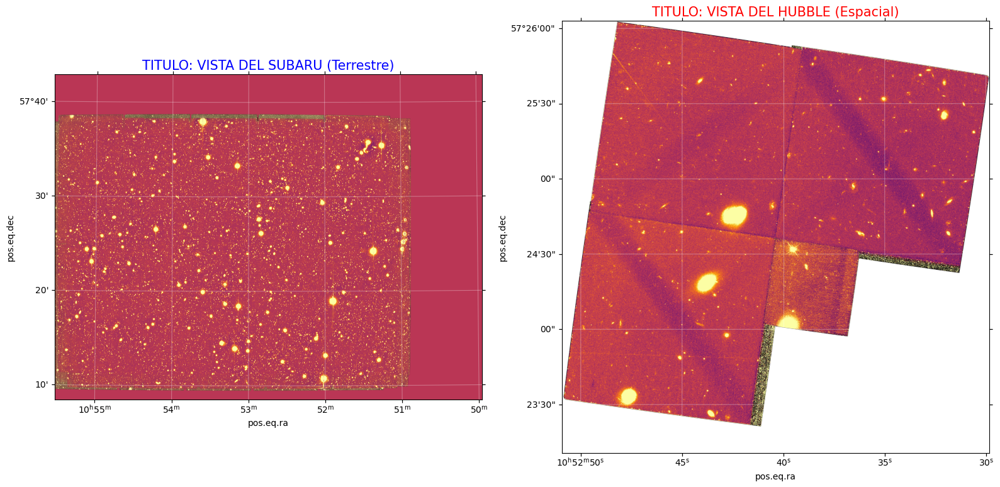

In [3]:
zscale = ZScaleInterval()

fig = plt.figure(figsize=(16, 8))

# Panel 1: Subaru
ax1 = fig.add_subplot(1, 2, 1, projection=wcs_sub)
limits_sub = zscale.get_limits(data_sub)
ax1.imshow(data_sub, vmin=limits_sub[0], vmax=limits_sub[1])
ax1.set_title('TITULO: VISTA DEL SUBARU (Terrestre)', fontsize=15, color='blue')
ax1.grid(color='white', ls='solid', alpha=0.3)

# Panel 2: Hubble
ax2 = fig.add_subplot(1, 2, 2, projection=wcs_hub)
limits_hub = zscale.get_limits(data_hub)
ax2.imshow(data_hub, vmin=limits_hub[0], vmax=limits_hub[1])
ax2.set_title('TITULO: VISTA DEL HUBBLE (Espacial)', fontsize=15, color='red')
ax2.grid(color='white', ls='solid', alpha=0.3)

plt.tight_layout()
plt.show()

### 3. Zoom en Coordenada: El momento de la verdad
Usamos una RA y Dec compartida para ver el mismo objeto en ambos telescopios.

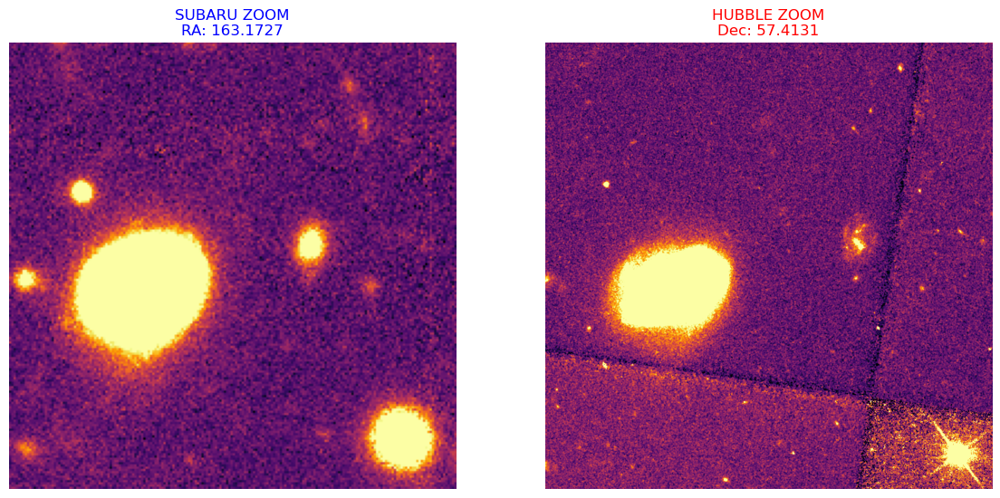

In [4]:
from astropy.coordinates import SkyCoord
import astropy.units as u


target_ra = 163.17269
target_dec = 57.41308
coord = SkyCoord(ra=target_ra*u.deg, dec=target_dec*u.deg, frame='icrs')

def make_zoom(data, wcs, target_coord, box_size=60):
    """Corta un pedazo de la imagen alrededor de la coordenada"""
    py, px = wcs.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    py, px = int(py), int(px)
    return data[px-box_size:px+box_size, py-box_size:py+box_size]


escala = 100 # Cambia este único número para controlar ambos zooms
zoom_sub = make_zoom(data_sub, wcs_sub, coord, box_size=escala)
zoom_hub = make_zoom(data_hub, wcs_hub, coord, box_size=escala * 4)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

ax1.imshow(zscale(zoom_sub))
ax1.set_title(f'SUBARU ZOOM\nRA: {target_ra:.4f}', color='blue')
ax1.axis('off')

ax2.imshow(zscale(zoom_hub))
ax2.set_title(f'HUBBLE ZOOM\nDec: {target_dec:.4f}', color='red')
ax2.axis('off')

plt.show()

/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value 

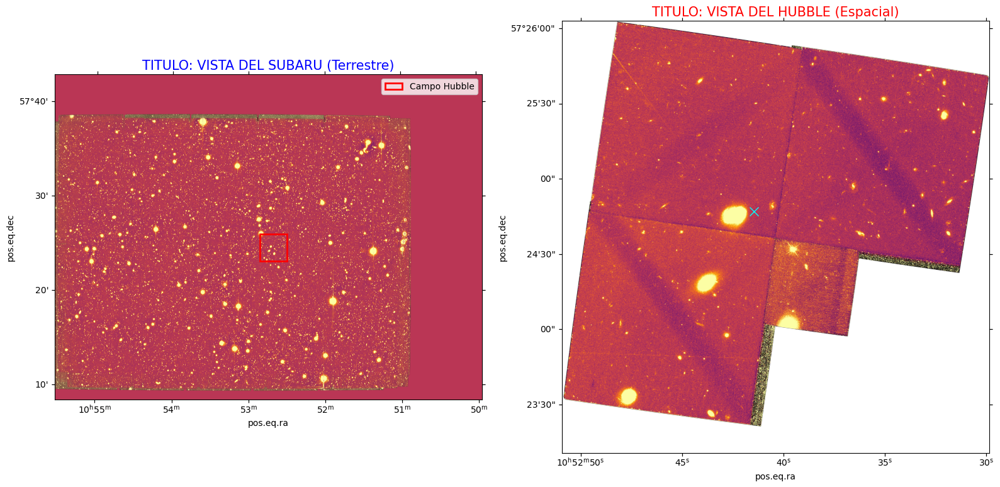

In [5]:
import matplotlib.patches as patches

zscale = ZScaleInterval()
fig = plt.figure(figsize=(16, 8))

# --- PANEL 1: SUBARU ---
ax1 = fig.add_subplot(1, 2, 1, projection=wcs_sub)
limits_sub = zscale.get_limits(data_sub)
ax1.imshow(data_sub, vmin=limits_sub[0], vmax=limits_sub[1])
ax1.set_title('TITULO: VISTA DEL SUBARU (Terrestre)', fontsize=15, color='blue')

# DIBUJAR EL RECTÁNGULO DEL HUBBLE SOBRE EL SUBARU
# 1. Obtenemos las coordenadas de las esquinas del Hubble (en píxeles del Hubble)
h_height, h_width = data_hub.shape
# 2. Convertimos esas esquinas a coordenadas Celestes (RA, Dec)
# Usamos las esquinas [0,0] y [ancho, alto]
coords_celestes = wcs_hub.pixel_to_world([0, h_width], [0, h_height])
# 3. Convertimos esas coordenadas Celestes a píxeles del Subaru
px_sub, py_sub = wcs_sub.world_to_pixel(coords_celestes)

# 4. Creamos el rectángulo
rect_width = px_sub[1] - px_sub[0]
rect_height = py_sub[1] - py_sub[0]
rect = patches.Rectangle((px_sub[0], py_sub[0]), rect_width, rect_height, 
                         linewidth=2, edgecolor='red', facecolor='none', label='Campo Hubble')
ax1.add_patch(rect)
ax1.legend()

# --- PANEL 2: HUBBLE ---
ax2 = fig.add_subplot(1, 2, 2, projection=wcs_hub)
limits_hub = zscale.get_limits(data_hub)
ax2.imshow(data_hub, vmin=limits_hub[0], vmax=limits_hub[1])
ax2.set_title('TITULO: VISTA DEL HUBBLE (Espacial)', fontsize=15, color='red')

# MARCAR EL CENTRO DEL TARGET EN AMBOS (Opcional, para no perder el píxel)
py_target, px_target = wcs_hub.all_world2pix(target_ra, target_dec, 0)
ax2.plot(py_target, px_target, 'x', color='cyan', markersize=10)

plt.tight_layout()
plt.show()

In [6]:
def degradar_hubble_a_subaru(image_hubble):
    # 1. Desenfoque (simulando la atmósfera terrestre)
    # sigma=3 es un ejemplo de la diferencia de nitidez
    blurred = gaussian_filter(image_hubble, sigma=3)
    
    # 2. Inyectar ruido (simulando el cielo terrestre)
    noise = np.random.normal(0, 0.01, blurred.shape)
    degraded = blurred + noise
    
    return degraded

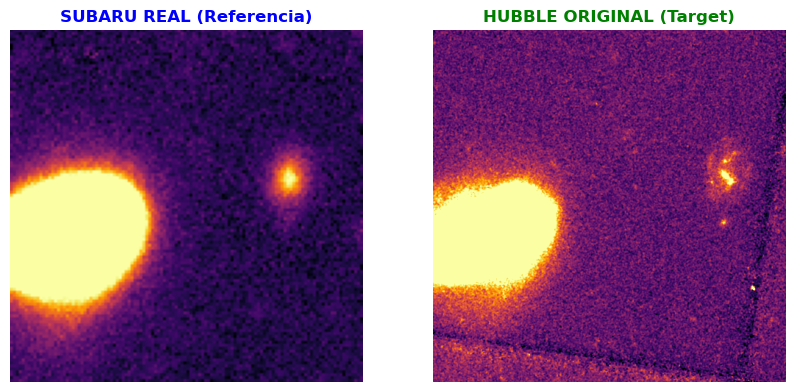

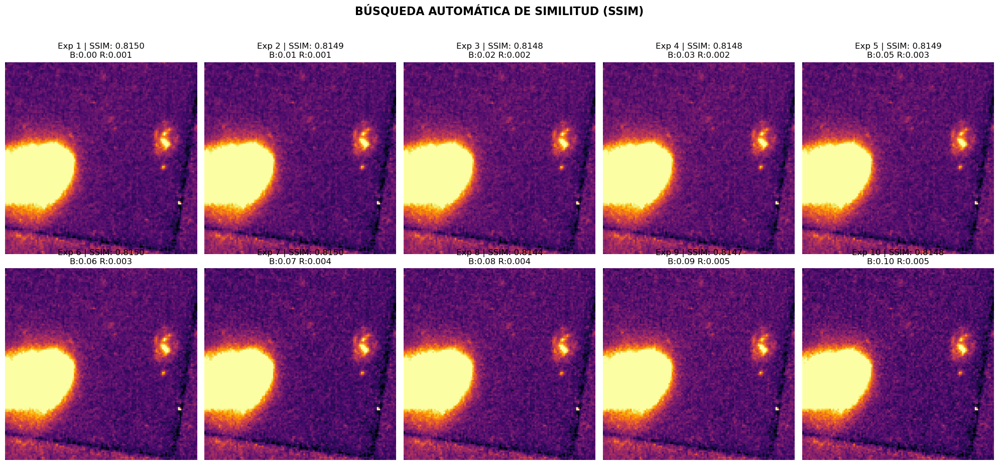

--- RESULTADO DEL ANÁLISIS ---
La IA sugiere el Experimento #7
Parámetros ideales: Blur=0.0670, Ruido=0.0035
Puntaje de similitud estructural: 0.8150


In [7]:

def create_training_experiments_suave(data_sub, wcs_sub, data_hub, wcs_hub, target_coord):
    zscale = ZScaleInterval()
    
    # 1. Extracción de recortes
    py_s, px_s = wcs_sub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    py_h, px_h = wcs_hub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    
    crop_sub = data_sub[int(px_s)-60:int(px_s)+60, int(py_s)-60:int(py_s)+60]
    crop_hub = data_hub[int(px_h)-240:int(px_h)+240, int(py_h)-240:int(py_h)+240]

    # Limpieza básica para evitar errores en SSIM
    crop_sub = np.nan_to_num(crop_sub)
    crop_hub = np.nan_to_num(crop_hub)

    # --- Escalamiento de Brillo ---
    hub_min, hub_max = np.min(crop_hub), np.max(crop_hub)
    sub_min, sub_max = np.min(crop_sub), np.max(crop_sub)
    hub_norm = (crop_hub - hub_min) / (hub_max - hub_min + 1e-10)
    hub_scaled = hub_norm * (sub_max - sub_min) + sub_min
    
    # Nuevo rango: El máximo ahora es tu antiguo mínimo (0.05 de Blur y 0.005 de Ruido)
    sigmas = np.linspace(0.001, 0.1, 10)    # Casi nada de blur
    noises = np.linspace(0.0005, 0.005, 10) # Ruido extremadamente tenue
    params = list(zip(sigmas, noises))
    
    # Variables para el ganador
    mejor_puntaje = -1
    mejor_exp = 0
    mejor_config = (0, 0)

    # Visualización de Referencias
    fig_ref, ax_ref = plt.subplots(1, 2, figsize=(10, 5))
    ax_ref[0].imshow(zscale(crop_sub))
    ax_ref[0].set_title("SUBARU REAL (Referencia)", color='blue', fontweight='bold')
    ax_ref[1].imshow(zscale(crop_hub))
    ax_ref[1].set_title("HUBBLE ORIGINAL (Target)", color='green', fontweight='bold')
    for a in ax_ref: a.axis('off')
    plt.show()

    # Visualización de Experimentos
    fig, axes = plt.subplots(2, 5, figsize=(20, 10))
    fig.suptitle('BÚSQUEDA AUTOMÁTICA DE SIMILITUD (SSIM)', fontsize=16, fontweight='bold')
    axes = axes.flatten()
    
    std_sub = np.std(crop_sub)
    target_shape = crop_hub.shape 

    for i, (sig, n_factor) in enumerate(params):
        # a. Degradación física
        hub_blurred = gaussian_filter(hub_scaled, sigma=sig) 
        hub_low_res = resize(hub_blurred, crop_sub.shape, anti_aliasing=True)
        
        # b. Ruido
        noise = np.random.normal(0, std_sub * n_factor, hub_low_res.shape)
        hub_low_res_noisy = hub_low_res + noise
        
        # c. CÁLCULO SSIM (Comparando matrices 120x120 o el tamaño que tenga crop_sub)
        # data_range es la diferencia entre el máximo y mínimo brillo
        drange = hub_low_res_noisy.max() - hub_low_res_noisy.min()
        score = ssim(crop_sub, hub_low_res_noisy, data_range=drange)
    
        # Guardar al mejor
        if score > mejor_puntaje:
            mejor_puntaje = score
            mejor_exp = i + 1
            mejor_config = (sig, n_factor)
        
        # d. Up-sampling solo para visualización
        hub_final = resize(hub_low_res_noisy, target_shape, order=0, anti_aliasing=False)
        
        axes[i].imshow(zscale(hub_final))
        axes[i].set_title(f"Exp {i+1} | SSIM: {score:.4f}\nB:{sig:.2f} R:{n_factor:.3f}")
        axes[i].axis('off')
        
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    print(f"--- RESULTADO DEL ANÁLISIS ---")
    print(f"La IA sugiere el Experimento #{mejor_exp}")
    print(f"Parámetros ideales: Blur={mejor_config[0]:.4f}, Ruido={mejor_config[1]:.4f}")
    print(f"Puntaje de similitud estructural: {mejor_puntaje:.4f}")

create_training_experiments_suave(data_sub, wcs_sub, data_hub, wcs_hub, coord)

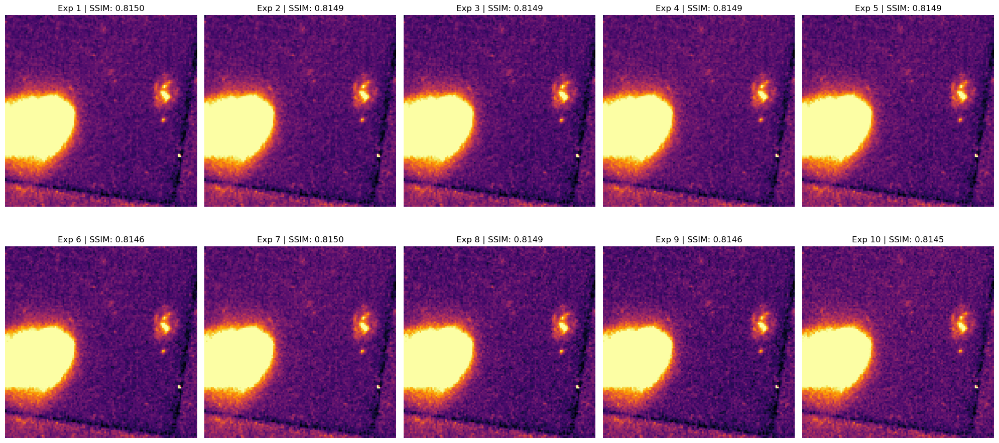

--- GANADOR: Exp 7 (SSIM: 0.8150) ---


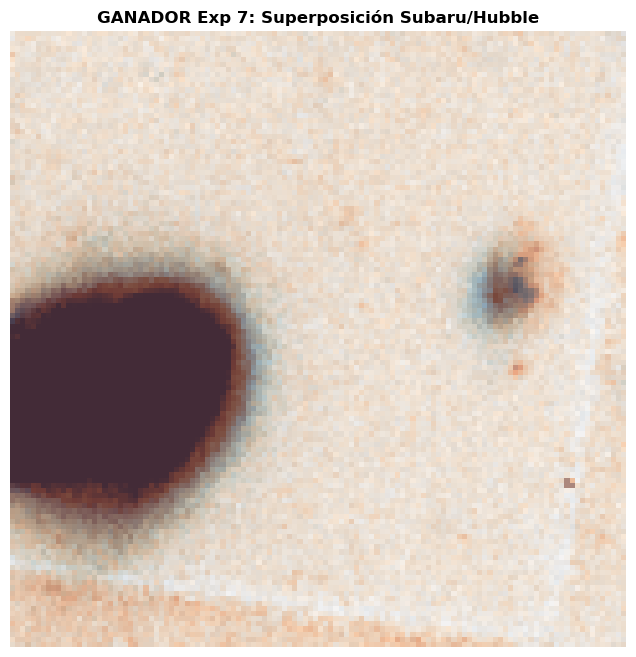

In [8]:

def apply_degradation(crop_hub, target_shape, sigma, n_factor, std_reference):
    """
    Función pura que aplica la degradación al Hubble.
    """
    # 1. Blur
    blurred = gaussian_filter(crop_hub, sigma=sigma)
    # 2. Downsampling
    low_res = resize(blurred, target_shape, anti_aliasing=True)
    # 3. Ruido
    noise = np.random.normal(0, std_reference * n_factor, low_res.shape)
    return low_res + noise

def visualize_alpha_overlay(data_sub, data_hub_degraded, alpha=0.3, title="Overlay"):
    """
    Superpone Subaru y Hubble Degradado con un canal Alpha.
    """
    zscale = ZScaleInterval()
    # Aseguramos que ambas tengan el mismo tamaño para el overlay
    # Redimensionamos el degradado al tamaño del Subaru si es necesario
    if data_hub_degraded.shape != data_sub.shape:
        data_hub_degraded = resize(data_hub_degraded, data_sub.shape, order=0)
        
    plt.figure(figsize=(8, 8))
    plt.imshow(zscale(data_sub), cmap='Blues', interpolation='nearest')
    plt.imshow(zscale(data_hub_degraded), cmap='Oranges', alpha=alpha, interpolation='nearest')
    plt.title(title, fontweight='bold')
    plt.axis('off')
    plt.show()

def create_training_experiments_suave(data_sub, wcs_sub, data_hub, wcs_hub, target_coord):
    zscale = ZScaleInterval()
    
    # 1. Extracción de recortes
    py_s, px_s = wcs_sub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    py_h, px_h = wcs_hub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    
    crop_sub = np.nan_to_num(data_sub[int(px_s)-60:int(px_s)+60, int(py_s)-60:int(py_s)+60])
    crop_hub = np.nan_to_num(data_hub[int(px_h)-240:int(px_h)+240, int(py_h)-240:int(py_h)+240])

    # --- Escalamiento de Brillo ---
    h_min, h_max = crop_hub.min(), crop_hub.max()
    s_min, s_max = crop_sub.min(), crop_sub.max()
    hub_scaled = ((crop_hub - h_min) / (h_max - h_min + 1e-10)) * (s_max - s_min) + s_min
    
    # Parámetros de búsqueda
    sigmas = np.linspace(0.001, 0.1, 10)
    noises = np.linspace(0.0005, 0.005, 10)
    params = list(zip(sigmas, noises))
    
    mejor_puntaje, mejor_exp, mejor_config = -1, 0, (0, 0)
    mejor_imagen_degradada = None

    # Visualización de Experimentos
    fig, axes = plt.subplots(2, 5, figsize=(20, 10))
    axes = axes.flatten()
    std_sub = np.std(crop_sub)

    for i, (sig, n_factor) in enumerate(params):
        # USAMOS LA FUNCIÓN REFACTORIZADA
        hub_low_res_noisy = apply_degradation(hub_scaled, crop_sub.shape, sig, n_factor, std_sub)
        
        # Cálculo SSIM
        drange = hub_low_res_noisy.max() - hub_low_res_noisy.min()
        score = ssim(crop_sub, hub_low_res_noisy, data_range=drange)
    
        if score > mejor_puntaje:
            mejor_puntaje = score
            mejor_exp = i + 1
            mejor_config = (sig, n_factor)
            mejor_imagen_degradada = hub_low_res_noisy
        
        # Mostrar para visualización (Up-sampling)
        hub_viz = resize(hub_low_res_noisy, crop_hub.shape, order=0)
        axes[i].imshow(zscale(hub_viz))
        axes[i].set_title(f"Exp {i+1} | SSIM: {score:.4f}")
        axes[i].axis('off')
        
    plt.tight_layout()
    plt.show()

    print(f"--- GANADOR: Exp {mejor_exp} (SSIM: {mejor_puntaje:.4f}) ---")
    
    # Visualizamos el resultado final con el Alfa solicitado
    visualize_alpha_overlay(crop_sub, mejor_imagen_degradada, alpha=0.5, 
                            title=f"GANADOR Exp {mejor_exp}: Superposición Subaru/Hubble")

# Ejecutar
create_training_experiments_suave(data_sub, wcs_sub, data_hub, wcs_hub, coord)

In [9]:


def clasificar_objetos(crop_hub):
    # Detectamos fuentes en la imagen del Hubble (que es la clara)
    # Usamos un umbral para separar objetos del fondo
    threshold = np.nanmedian(crop_hub) + 3 * np.nanstd(crop_hub)
    segm = detect_sources(crop_hub, threshold, npixels=5)
    
    cat = data_properties(crop_hub, segm)
    
    labels = []
    for obj in cat:
        # La elongación y el área son claves
        # Estrellas: circularidad alta (ellipticity ~ 0) y tamaño mínimo
        if obj.ellipticity < 0.1 and obj.area < 50: 
            labels.append("Estrella")
        else:
            labels.append("Galaxia")
            
    return cat, labels

ID    | Elongation   | Sigma      | Clase
---------------------------------------------
0     | 1.443        | 37.417     | GALAXIA
1     | 1.594        | 1.461      | GALAXIA
2     | 2.073        | 6.844      | GALAXIA
3     | 2.236        | 3.084      | GALAXIA


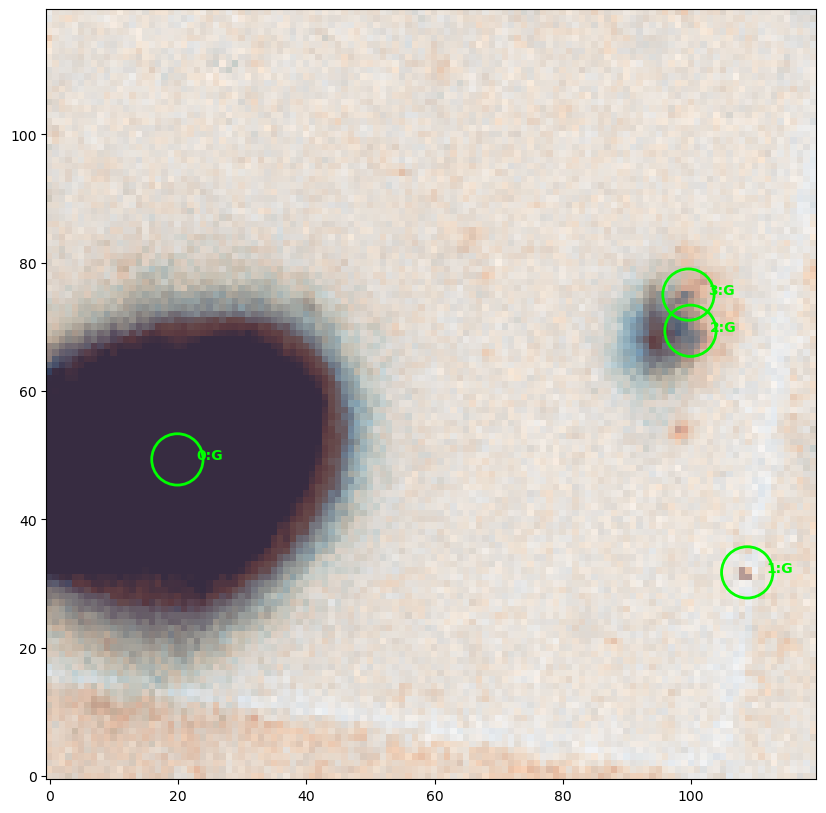

In [10]:


def classify_and_mark_debug(data_sub, data_hub, wcs_sub, wcs_hub, target_coord):
    zscale = ZScaleInterval()
    
    # 1. Extracción y Limpieza
    py_s, px_s = wcs_sub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    py_h, px_h = wcs_hub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    
    crop_sub = np.nan_to_num(data_sub[int(px_s)-60:int(px_s)+60, int(py_s)-60:int(py_s)+60])
    crop_hub = np.nan_to_num(data_hub[int(px_h)-240:int(px_h)+240, int(py_h)-240:int(py_h)+240])

    # 2. Detección más conservadora (Subimos npixels para evitar ruido)
    threshold = detect_threshold(crop_hub, nsigma=5.0) # Umbral más alto
    segm = detect_sources(crop_hub, threshold, npixels=20) 
    
    if segm is None:
        print("No se detectó nada. Intenta bajar nsigma a 3.0")
        return

    cat = SourceCatalog(crop_hub, segm)
    scale_factor = crop_sub.shape[0] / crop_hub.shape[0]
    hub_deg = resize(crop_hub, crop_sub.shape, order=1) 
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(zscale(crop_sub), cmap='Blues')
    ax.imshow(zscale(hub_deg), cmap='Oranges', alpha=0.4)

    print(f"{'ID':<5} | {'Elongation':<12} | {'Sigma':<10} | {'Clase'}")
    print("-" * 45)

    for i, obj in enumerate(cat):
        x_sub = obj.xcentroid * scale_factor
        y_sub = obj.ycentroid * scale_factor
        
        # --- CRITERIO REFINADO ---
        # Una estrella suele tener elongación < 1.1 y un sigma (ancho) pequeño.
        elong = obj.elongation
        size = obj.semimajor_sigma.value
        
        # Si es muy redondo y muy pequeño, es estrella.
        is_galaxy = elong > 1.15 or size > 1.8
        
        res = "GALAXIA" if is_galaxy else "ESTRELLA"
        print(f"{i:<5} | {elong:<12.3f} | {size:<10.3f} | {res}")

        color = 'lime' if is_galaxy else 'red'
        ax.add_patch(plt.Circle((x_sub, y_sub), 4, color=color, fill=False, lw=2))
        ax.text(x_sub + 3, y_sub, f"{i}:{res[0]}", color=color, fontsize=10, fontweight='bold')

    plt.show()

classify_and_mark_debug(data_sub, data_hub, wcs_sub, wcs_hub, coord)

In [11]:

def consultar_catalogo_real(target_coord, radius_arcmin=2.0):
    # Configuramos Vizier para que no limite los resultados
    v = Vizier(columns=['*', '_r'], row_limit=-1)
    
    # 1. Buscamos en Gaia DR3 (El estándar de oro para estrellas)
    # Si un objeto está aquí con un "parallax" claro, es una ESTRELLA.
    result_gaia = v.query_region(target_coord, radius=radius_arcmin*u.arcmin, catalog='I/355/gaiadr3')
    
    # 2. Buscamos en el Hubble Source Catalog (HSC)
    # Este ya trae una columna llamada 'CI' (Concentration Index) que dice si es extendido o puntual.
    result_hsc = v.query_region(target_coord, radius=radius_arcmin*u.arcmin, catalog='B/hst/hsc2')

    return result_gaia, result_hsc

# Ejecutar consulta
# gaia, hsc = consultar_catalogo_real(coord)

🛰️ Intentando Gaia DR3...


/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)


✅ Gaia: 71 objetos encontrados.
🌌 Intentando Pan-STARRS1...


/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)


✅ Pan-STARRS: 683 objetos encontrados.


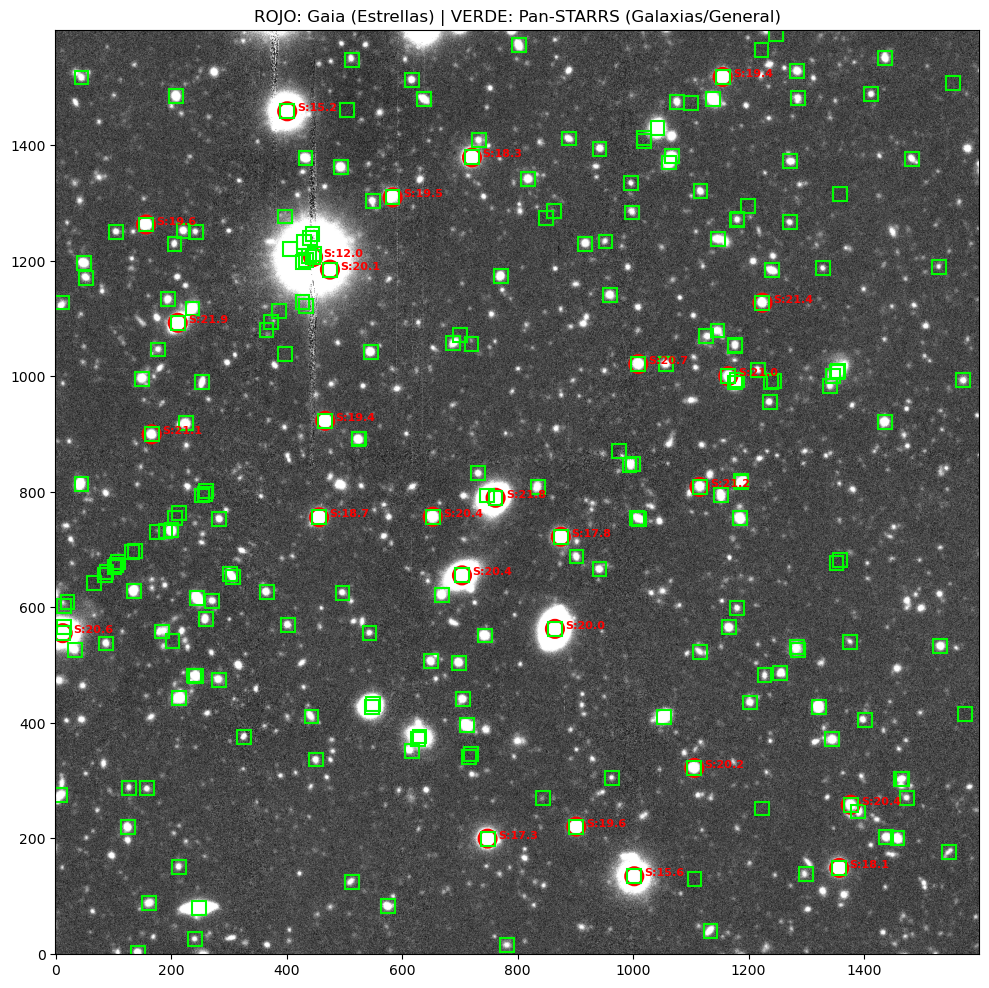

In [13]:


def safe_get_coords(table):
    """Busca nombres de columnas de RA/Dec de forma segura."""
    colnames = table.colnames
    ra_name = next((c for c in ['RA_ICRS', 'raMean', 'ra', 'RAJ2000'] if c in colnames), None)
    dec_name = next((c for c in ['DE_ICRS', 'decMean', 'dec', 'DEJ2000'] if c in colnames), None)
    return ra_name, dec_name

def visualizacion_dual_catalogos(data_sub, wcs_sub, target_coord, window_size=200):
    zscale = ZScaleInterval()
    # Timeout largo para evitar cortes de conexión
    v = Vizier(columns=['**'], row_limit=1000, timeout=120)
    
    # 1. Preparar el recorte del Subaru (esto siempre funciona)
    py_s, px_s = wcs_sub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    y_min, y_max = int(px_s)-window_size, int(px_s)+window_size
    x_min, x_max = int(py_s)-window_size, int(py_s)+window_size
    
    # Asegurar límites dentro de la imagen
    y_min, y_max = max(0, y_min), min(data_sub.shape[0], y_max)
    x_min, x_max = max(0, x_min), min(data_sub.shape[1], x_max)
    
    crop_sub = np.nan_to_num(data_sub[y_min:y_max, x_min:x_max])
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(zscale(crop_sub), cmap='gray', origin='lower')

    # 2. Consultar y Dibujar GAIA (Rojo)
    print("🛰️ Intentando Gaia DR3...")
    try:
        gaia_res = v.query_region(target_coord, radius=5*u.arcmin, catalog='I/355/gaiadr3')
        if gaia_res and len(gaia_res) > 0:
            t = gaia_res[0]
            r_c, d_c = safe_get_coords(t)
            mag_c = next((c for c in ['Gmag', 'phot_g_mean_mag'] if c in t.colnames), None)
            
            for row in t:
                gx, gy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                lx, ly = gx - x_min, gy - y_min
                if 0 <= lx <= (window_size*2) and 0 <= ly <= (window_size*2):
                    ax.add_patch(plt.Circle((lx, ly), 15, color='red', fill=False, lw=2))
                    if mag_c: ax.text(lx+18, ly, f"S:{row[mag_c]:.1f}", color='red', fontsize=8, weight='bold')
            print(f"✅ Gaia: {len(t)} objetos encontrados.")
    except Exception as e: print(f"⚠️ Gaia falló: {e}")

    # 3. Consultar y Dibujar Pan-STARRS (Verde)
    print("🌌 Intentando Pan-STARRS1...")
    try:
        ps1_res = v.query_region(target_coord, radius=5*u.arcmin, catalog='II/349/ps1')
        if ps1_res and len(ps1_res) > 0:
            t = ps1_res[0]
            r_c, d_c = safe_get_coords(t)
            
            for row in t:
                gx, gy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                lx, ly = gx - x_min, gy - y_min
                if 0 <= lx <= (window_size*2) and 0 <= ly <= (window_size*2):
                    # Dibujamos cuadrados para lo que Pan-STARRS detecta
                    ax.add_patch(plt.Rectangle((lx-12, ly-12), 24, 24, color='lime', fill=False, lw=1.5))
            print(f"✅ Pan-STARRS: {len(t)} objetos encontrados.")
    except Exception as e: print(f"⚠️ Pan-STARRS falló: {e}")

    ax.set_title("ROJO: Gaia (Estrellas) | VERDE: Pan-STARRS (Galaxias/General)")
    plt.show()

# Ejecutar
visualizacion_dual_catalogos(data_sub, wcs_sub, coord, window_size=800)


LOG DE VALIDACIÓN CRUZADA Y METADATOS
ESTADÍSTICAS: Background RMS (Ruido): 8.512134e-01


/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)


✅ Gaia: 71 estrellas detectadas.


/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/var/folders/2r/99sn8b9x5xj8qv22hx5m4plw0000gn/T/ipykernel_87821/1157970277.py:53: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  if not np.isnan(row['imag']): ax.text(lx-30, ly+30, f"i:{row['imag']:.1f}", color='lime', fontsize=7)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/li

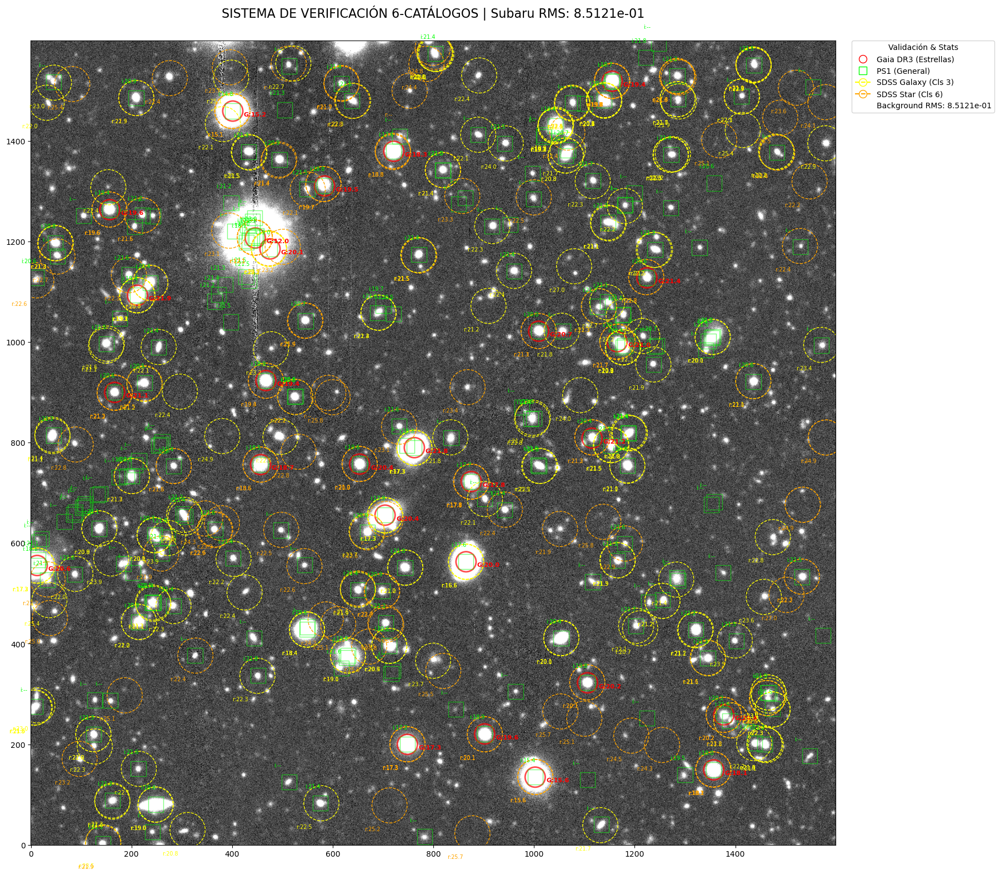

In [69]:
def safe_get_coords(table):
    colnames = table.colnames
    ra_name = next((c for c in ['RA_ICRS', 'raMean', 'ra', 'RAJ2000', 'ra_gz2', 'RAdeg'] if c in colnames), None)
    dec_name = next((c for c in ['DE_ICRS', 'decMean', 'dec', 'DEJ2000', 'dec_gz2', 'DEdeg'] if c in colnames), None)
    return ra_name, dec_name

def visualizacion_definitiva_6_catalogos(data_sub, wcs_sub, target_coord, window_size=800):
    zscale = ZScaleInterval()
    v = Vizier(columns=['**'], row_limit=5000, timeout=200)
    
    # 1. Recorte y cálculo de Ruido (RMS)
    py_s, px_s = wcs_sub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    y_min, y_max = max(0, int(px_s)-window_size), min(data_sub.shape[0], int(px_s)+window_size)
    x_min, x_max = max(0, int(py_s)-window_size), min(data_sub.shape[1], int(py_s)+window_size)
    
    crop_sub = np.nan_to_num(data_sub[y_min:y_max, x_min:x_max])
    bkg_noise = mad_std(crop_sub) # Ruido robusto
    
    fig, ax = plt.subplots(figsize=(18, 18))
    ax.imshow(zscale(crop_sub), cmap='gray', origin='lower')

    legend_elements = []
    print(f"\n{'='*70}\nLOG DE VALIDACIÓN CRUZADA Y METADATOS\n{'='*70}")
    print(f"ESTADÍSTICAS: Background RMS (Ruido): {bkg_noise:.6e}")

    # --- PASO 1: GAIA DR3 (Estrellas) ---
    try:
        res = v.query_region(target_coord, radius=5*u.arcmin, catalog='I/355/gaiadr3')
        if res:
            t = res[0]
            r_c, d_c = safe_get_coords(t)
            for row in t:
                gx, gy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                lx, ly = gx - x_min, gy - y_min
                if 0 <= lx <= (window_size*2) and 0 <= ly <= (window_size*2):
                    ax.add_patch(plt.Circle((lx, ly), 20, color='red', fill=False, lw=2, alpha=0.7))
                    ax.text(lx+22, ly-10, f"G:{row['Gmag']:.1f}", color='red', fontsize=8, weight='bold')
            legend_elements.append(mlines.Line2D([], [], color='red', marker='o', markersize=10, fillstyle='none', ls='None', label='Gaia DR3 (Estrellas)'))
            print(f"✅ Gaia: {len(t)} estrellas detectadas.")
    except: print("⚠️ Gaia falló")

    # --- PASO 2: PAN-STARRS1 (General) ---
    try:
        res = v.query_region(target_coord, radius=5*u.arcmin, catalog='II/349/ps1')
        if res:
            t = res[0]
            r_c, d_c = safe_get_coords(t)
            for row in t:
                gx, gy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                lx, ly = gx - x_min, gy - y_min
                if 0 <= lx <= (window_size*2) and 0 <= ly <= (window_size*2):
                    ax.add_patch(plt.Rectangle((lx-15, ly-15), 30, 30, color='lime', fill=False, lw=1, alpha=0.5))
                    if not np.isnan(row['imag']): ax.text(lx-30, ly+30, f"i:{row['imag']:.1f}", color='lime', fontsize=7)
            legend_elements.append(mlines.Line2D([], [], color='lime', marker='s', markersize=10, fillstyle='none', ls='None', label='PS1 (General)'))
    except: print("⚠️ PS1 falló")

    # --- PASO 3: DESI LEGACY (Morfología) ---
    try:
        res = v.query_region(target_coord, radius=5*u.arcmin, catalog='II/371/ls_dr10')
        if res:
            t = res[0]
            r_c, d_c = safe_get_coords(t)
            for row in t:
                gx, gy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                lx, ly = gx - x_min, gy - y_min
                if 0 <= lx <= (window_size*2) and 0 <= ly <= (window_size*2):
                    ax.add_patch(plt.Circle((lx, ly), 25, color='white', fill=False, lw=1.5, ls=':', alpha=0.8))
            legend_elements.append(mlines.Line2D([], [], color='white', marker='o', markersize=10, fillstyle='none', ls=':', label='DESI Legacy (Morfología)'))
    except: print("⚠️ DESI falló")

    # --- PASO 4: GALAXY ZOO (Humanos) ---
    try:
        res = v.query_region(target_coord, radius=5*u.arcmin, catalog='VII/282/gz2main')
        if res:
            t = res[0]
            r_c, d_c = safe_get_coords(t)
            for row in t:
                gx, gy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                lx, ly = gx - x_min, gy - y_min
                if 0 <= lx <= (window_size*2) and 0 <= ly <= (window_size*2):
                    ax.scatter(lx, ly, marker='D', s=120, edgecolors='cyan', facecolors='none', lw=2)
            legend_elements.append(mlines.Line2D([], [], color='cyan', marker='D', markersize=10, fillstyle='none', ls='None', label='Galaxy Zoo (Human)'))
    except: print("⚠️ GalaxyZoo falló")

    # --- PASO 5: CANDELS (Ultra-Deep) ---
    try:
        res = v.query_region(target_coord, radius=3*u.arcmin, catalog='J/ApJS/214/24')
        if res:
            t = res[0]
            r_c, d_c = safe_get_coords(t)
            for row in t:
                gx, gy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                lx, ly = gx - x_min, gy - y_min
                if 0 <= lx <= (window_size*2) and 0 <= ly <= (window_size*2):
                    ax.scatter(lx, ly, marker='+', s=180, color='magenta', lw=2)
                    ax.text(lx+10, ly+25, f"H:{row['F160W']:.1f}", color='magenta', fontsize=8)
            legend_elements.append(mlines.Line2D([], [], color='magenta', marker='+', markersize=12, ls='None', label='CANDELS (Hubble)'))
    except: print("⚠️ CANDELS no disponible")

    # --- PASO 6: SDSS DR16 (Espectros) ---
    try:
        res = v.query_region(target_coord, radius=5*u.arcmin, catalog='V/154/sdss16')
        if res:
            t = res[0]
            r_c, d_c = safe_get_coords(t)
            for row in t:
                gx, gy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                lx, ly = gx - x_min, gy - y_min
                if 0 <= lx <= (window_size*2) and 0 <= ly <= (window_size*2):
                    color = 'yellow' if row['class'] == 3 else 'orange'
                    ax.add_patch(plt.Circle((lx, ly), 35, color=color, fill=False, lw=1, ls='--'))
                    ax.text(lx-50, ly-50, f"r:{row['rmag']:.1f}", color=color, fontsize=7)
            legend_elements.append(mlines.Line2D([], [], color='yellow', marker='o', markersize=10, fillstyle='none', ls='--', label='SDSS Galaxy (Cls 3)'))
            legend_elements.append(mlines.Line2D([], [], color='orange', marker='o', markersize=10, fillstyle='none', ls='--', label='SDSS Star (Cls 6)'))
    except: print("⚠️ SDSS falló")

    # --- LEYENDA Y RUIDO ---
    legend_elements.append(mlines.Line2D([], [], color='none', label=f'Background RMS: {bkg_noise:.4e}'))
    ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1.02, 1), title="Validación & Stats", borderaxespad=0, fontsize=10)

    plt.title(f"SISTEMA DE VERIFICACIÓN 6-CATÁLOGOS | Subaru RMS: {bkg_noise:.4e}", fontsize=16, pad=30)
    plt.tight_layout()
    plt.show()

# Ejecutar
visualizacion_definitiva_6_catalogos(data_sub, wcs_sub, coord, window_size=800)

/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value encountered in do_format (vectorized)
  outputs = ufunc(*inputs)
/Users/urieldiazvillamil/miniconda3/envs/torch_cv/lib/python3.10/site-packages/numpy/lib/_function_base_impl.py:2605: RuntimeWarning: invalid value 

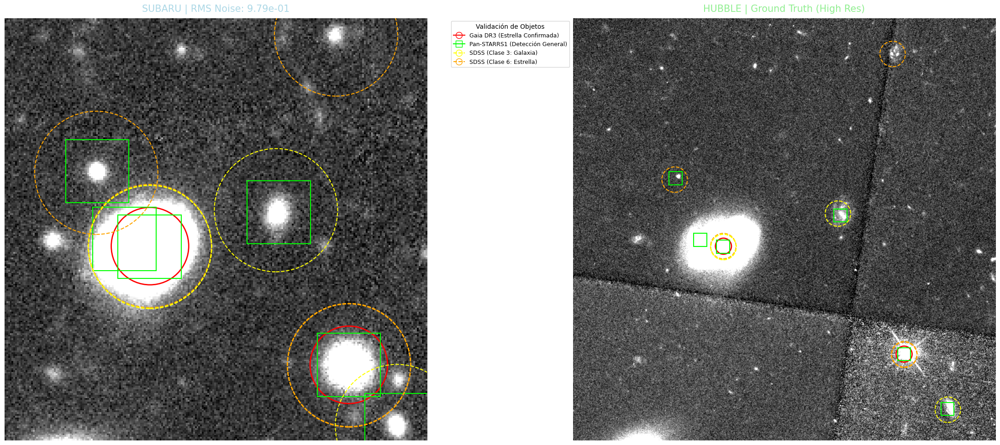

In [21]:
def visualizacion_comparativa_validada(data_sub, wcs_sub, data_hub, wcs_hub, target_coord, window_sub=120, window_hub=580):
    zscale = ZScaleInterval()
    v = Vizier(columns=['**'], row_limit=5000, timeout=200)
    
    # 1. Preparar recortes (Subaru y Hubble)
    py_s, px_s = wcs_sub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    py_h, px_h = wcs_hub.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0)
    
    s_ymin, s_ymax = max(0, int(px_s)-window_sub), min(data_sub.shape[0], int(px_s)+window_sub)
    s_xmin, s_xmax = max(0, int(py_s)-window_sub), min(data_sub.shape[1], int(py_s)+window_sub)
    crop_sub = np.nan_to_num(data_sub[s_ymin:s_ymax, s_xmin:s_xmax])
    
    h_ymin, h_ymax = max(0, int(px_h)-window_hub), min(data_hub.shape[0], int(px_h)+window_hub)
    h_xmin, h_xmax = max(0, int(py_h)-window_hub), min(data_hub.shape[1], int(py_h)+window_hub)
    crop_hub = np.nan_to_num(data_hub[h_ymin:h_ymax, h_xmin:h_xmax])

    rms_sub = mad_std(crop_sub)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 11))
    ax1.imshow(zscale(crop_sub), cmap='gray', origin='lower')
    ax2.imshow(zscale(crop_hub), cmap='gray', origin='lower')
    
    ax1.set_title(f"SUBARU | RMS Noise: {rms_sub:.2e}", color='lightblue', fontsize=15, pad=10)
    ax2.set_title("HUBBLE | Ground Truth (High Res)", color='lightgreen', fontsize=15, pad=10)

    # --- DICCIONARIO DE ETIQUETAS MEJORADO ---
    # Nota: SDSS se maneja aparte por tener dos clases
    catalogs = {
        'I/355/gaiadr3':  {'label': 'Gaia DR3 (Estrella Confirmada)', 'color': 'red', 'marker': 'o', 'size': 22, 'ls': '-', 'type': 'circle'},
        'II/349/ps1':     {'label': 'Pan-STARRS1 (Detección General)', 'color': 'lime', 'marker': 's', 'size': 18, 'ls': '-', 'type': 'rect'},
        'II/371/ls_dr10': {'label': 'DESI Legacy (Morfología Candidata)', 'color': 'white', 'marker': 'o', 'size': 28, 'ls': ':', 'type': 'circle'},
        'VII/282/gz2main':{'label': 'Galaxy Zoo 2 (Galaxia - Voto Humano)', 'color': 'cyan', 'marker': 'D', 'size': 120, 'ls': '-', 'type': 'scatter'},
        'J/ApJS/214/24':  {'label': 'CANDELS (Galaxia - Resolución Hubble)', 'color': 'magenta', 'marker': '+', 'size': 180, 'ls': '-', 'type': 'scatter'}
    }

    legend_elements = []

    # Procesar catálogos estándar
    for cat_id, info in catalogs.items():
        try:
            res = v.query_region(target_coord, radius=2*u.arcmin, catalog=cat_id)
            if res:
                t = res[0]
                r_c, d_c = safe_get_coords(t)
                for row in t:
                    sx, sy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                    hx, hy = wcs_hub.all_world2pix(row[r_c], row[d_c], 0)
                    
                    for ax, lx, ly, x_off, y_off, w_z in [(ax1, sx-s_xmin, sy-s_ymin, window_sub, window_sub, window_sub), 
                                                         (ax2, hx-h_xmin, hy-h_ymin, window_hub, window_hub, window_hub)]:
                        if 0 <= lx <= (w_z*2) and 0 <= ly <= (w_z*2):
                            if info['type'] == 'circle':
                                ax.add_patch(plt.Circle((lx, ly), info['size'], color=info['color'], fill=False, lw=2, ls=info['ls']))
                            elif info['type'] == 'rect':
                                ax.add_patch(plt.Rectangle((lx-info['size'], ly-info['size']), info['size']*2, info['size']*2, color=info['color'], fill=False, lw=1.5))
                            elif info['type'] == 'scatter':
                                ax.scatter(lx, ly, marker=info['marker'], s=info['size'], edgecolors=info['color'], facecolors='none', lw=2)
                
                legend_elements.append(mlines.Line2D([], [], color=info['color'], marker=info['marker'], markersize=10, 
                                                   label=info['label'], ls='None' if info['type']=='scatter' else info['ls'], fillstyle='none'))
        except: continue

    # --- MANEJO ESPECIAL SDSS DR16 (Diferenciación de Clase) ---
    try:
        res = v.query_region(target_coord, radius=2*u.arcmin, catalog='V/154/sdss16')
        if res:
            t = res[0]
            r_c, d_c = safe_get_coords(t)
            # Añadir las dos variantes a la leyenda una sola vez
            legend_elements.append(mlines.Line2D([], [], color='yellow', marker='o', markersize=10, fillstyle='none', ls='--', label='SDSS (Clase 3: Galaxia)'))
            legend_elements.append(mlines.Line2D([], [], color='orange', marker='o', markersize=10, fillstyle='none', ls='--', label='SDSS (Clase 6: Estrella)'))
            
            for row in t:
                sx, sy = wcs_sub.all_world2pix(row[r_c], row[d_c], 0)
                hx, hy = wcs_hub.all_world2pix(row[r_c], row[d_c], 0)
                # Elegir color según clase física
                cls_color = 'yellow' if row['class'] == 3 else 'orange'
                
                for ax, lx, ly, w_z in [(ax1, sx-s_xmin, sy-s_ymin, window_sub), (ax2, hx-h_xmin, hy-h_ymin, window_hub)]:
                    if 0 <= lx <= (w_z*2) and 0 <= ly <= (w_z*2):
                        ax.add_patch(plt.Circle((lx, ly), 35, color=cls_color, fill=False, lw=1.5, ls='--'))
    except: pass

    # Leyenda final y limpieza
    ax1.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1.05, 1), title="Validación de Objetos", fontsize=9)
    for ax in [ax1, ax2]: ax.axis('off')
    
    plt.tight_layout()
    plt.show()
# Llamada a la función
visualizacion_comparativa_validada(data_sub, wcs_sub, data_hub, wcs_hub, coord)

In [68]:
def catalog_validator_scanner(target_coord, radius_arcmin=2):
    """
    Escanea los 6 catálogos y devuelve una lista de objetos validados con su clase.
    """
    v = Vizier(columns=['**'], row_limit=5000, timeout=200)
    validated_objects = []
    
    # Definición de prioridades y catálogos
    cat_config = {
        'I/355/gaiadr3':  {'class': 'estrella', 'priority': 1}, # Gaia manda en estrellas
        'J/ApJS/214/24':  {'class': 'galaxia',  'priority': 1}, # CANDELS manda en galaxias
        'VII/282/gz2main':{'class': 'galaxia',  'priority': 2}, # Galaxy Zoo
        'V/154/sdss16':   {'class': 'auto',     'priority': 3}, # SDSS (mixto)
    }

    print(f"📡 Iniciando escaneo de validación para {target_coord.ra.deg:.4f}, {target_coord.dec.deg:.4f}...")

    for cat_id, info in cat_config.items():
        try:
            res = v.query_region(target_coord, radius=radius_arcmin*u.arcmin, catalog=cat_id)
            if res:
                table = res[0]
                r_c, d_c = safe_get_coords(table)
                
                for row in table:
                    obj_class = info['class']
                    
                    # Lógica especial para SDSS
                    if info['class'] == 'auto':
                        obj_class = 'galaxia' if row['class'] == 3 else 'estrella'
                    
                    obj_data = {
                        'ra': float(row[r_c]),
                        'dec': float(row[d_c]),
                        'label': obj_class,
                        'source': cat_id,
                        'priority': info['priority']
                    }
                    validated_objects.append(obj_data)
        except:
            continue

    print(f"✅ Escaneo finalizado. Se encontraron {len(validated_objects)} registros brutos.")
    return validated_objects

def extract_validated_tiles_pipeline(data_sub, wcs_sub, data_hub, wcs_hub, object_list, box_size=64):
    """
    Toma la lista de objetos y extrae pares de tiles Subaru/Hubble centrados.
    """
    dataset = []
    scale = 4 # Hubble resolution factor
    
    for obj in object_list:
        try:
            # 1. Convertir RA/Dec a píxeles para ambos telescopios
            ps_y, ps_x = wcs_sub.all_world2pix(obj['ra'], obj['dec'], 0)
            ph_y, ph_x = wcs_hub.all_world2pix(obj['ra'], obj['dec'], 0)
            
            # 2. Definir límites del recorte (Subaru)
            s_tile = data_sub[int(ps_x)-box_size : int(ps_x)+box_size, 
                              int(ps_y)-box_size : int(ps_y)+box_size]
            
            # 3. Definir límites del recorte (Hubble - escalado)
            h_box = box_size * scale
            h_tile = data_hub[int(ph_x)-h_box : int(ph_x)+h_box, 
                              int(ph_y)-h_box : int(ph_y)+h_box]
            
            # 4. Validar integridad (que no sea un recorte parcial en el borde)
            if s_tile.shape == (box_size*2, box_size*2) and h_tile.shape == (h_box*2, h_box*2):
                dataset.append({
                    'subaru': np.nan_to_num(s_tile),
                    'hubble': np.nan_to_num(h_tile),
                    'label': obj['label'],
                    'ra_dec': (obj['ra'], obj['dec'])
                })
        except:
            continue # Si el objeto está fuera del rango del FITS cargado
            
    print(f"📦 Pipeline completado: {len(dataset)} tiles listos para entrenamiento.")
    return dataset

def plot_validated_dataset_with_center(dataset, n_samples=3):
    zscale = ZScaleInterval()
    n = min(n_samples, len(dataset))
    
    fig, axes = plt.subplots(n, 2, figsize=(12, 5 * n))
    if n == 1: axes = np.expand_dims(axes, axis=0)

    for i in range(n):
        tile = dataset[i]
        
        for j, key in enumerate(['subaru', 'hubble']):
            img = tile[key]
            axes[i, j].imshow(zscale(img), cmap='gray', origin='lower')
            
            # Dibujar cruz en el centro exacto del recorte
            cy, cx = img.shape[0] // 2, img.shape[1] // 2
            axes[i, j].axhline(cy, color='red', lw=0.8, alpha=0.5)
            axes[i, j].axvline(cx, color='red', lw=0.8, alpha=0.5)
            
            axes[i, j].set_title(f"{key.upper()} - {tile['label']}")
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

    

In [84]:
class AstroDatasetManager:
    def __init__(self, scale_factor=4):
        self.scale = scale_factor
        self.zscale = ZScaleInterval()
        
        # --- PARÁMETROS GANADORES (EXPERIMENTO #7) ---
        self.sigma_7 = 0.0670  # Nivel de desenfoque atmosférico
        self.noise_7 = 0.0035  # Factor de ruido del sensor
        self.target_ssim = 0.8150 

    def extract_crop(self, data, wcs, coord, box_size):
        """Extrae recortes de forma independiente."""
        try:
            px, py = wcs.all_world2pix(coord.ra.deg, coord.dec.deg, 0)
            ix, iy = int(px), int(py)
            crop = data[iy-box_size:iy+box_size, ix-box_size:ix+box_size]
            
            if crop.shape != (box_size*2, box_size*2):
                return None
            return np.nan_to_num(crop)
        except Exception:
            return None

    def generar_degradacion_exp7(self, crop_hub, target_shape, std_ref=1.0):
        """
        Aplica la lógica exacta del Experimento #7.
        std_ref: Desviación estándar de la imagen real (Subaru) para escalar el ruido.
        """
        # 1. Blur Gaussiano (Sigma del Exp #7)
        blurred = gaussian_filter(crop_hub, sigma=self.sigma_7)
        
        # 2. Downsampling (De Hubble a Subaru)
        low_res = resize(blurred, target_shape, anti_aliasing=True)
        
        # 3. Ruido Gaussiano (Factor del Exp #7)
        # El ruido se inyecta proporcionalmente al ruido de referencia
        noise = np.random.normal(0, std_ref * self.noise_7, low_res.shape)
        
        return low_res + noise

    # --- MÉTODOS DE VISUALIZACIÓN ---

    def comparar_degradacion_real(self, sub_real, hub_original, hub_degradado):
        """
        Muestra la comparación definitiva para validar el Experimento #7.
        """
        fig, axes = plt.subplots(1, 3, figsize=(21, 7))
        
        imgs = [hub_original, hub_degradado, sub_real]
        titles = [
            "Hubble Original (High-Res)",
            f"Simulación Exp #7\n(Blur={self.sigma_7}, Noise={self.noise_7})",
            "Subaru Real (Objetivo)"
        ]
        colors = ['white', 'yellow', 'cyan']

        for ax, img, title, col in zip(axes, imgs, titles, colors):
            ax.imshow(self.zscale(img), cmap='gray', origin='lower')
            ax.set_title(title, color=col, fontsize=14, pad=15)
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()

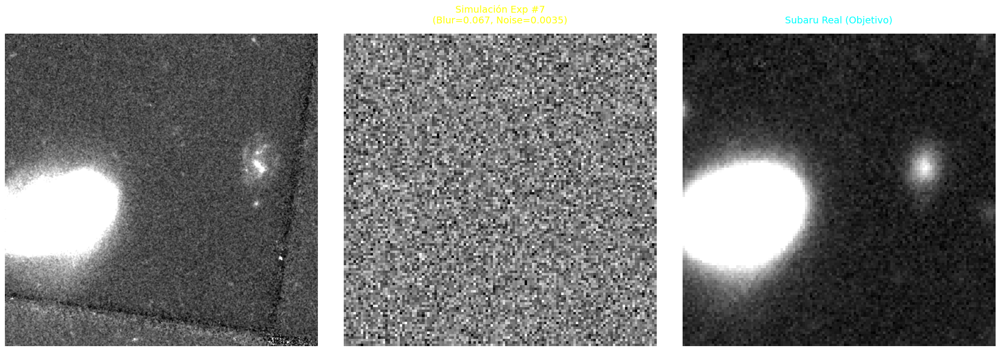

In [ ]:
# 1. Configuración de precisión
manager = AstroDatasetManager(scale_factor=4)
escala_sub = 64  # Resultará en 128x128
escala_hub = escala_sub * 4

# 2. Extraer recortes individualmente
crop_s = manager.extract_crop(data_sub, wcs_sub, coord, box_size=escala_sub)
crop_h = manager.extract_crop(data_hub, wcs_hub, coord, box_size=escala_hub)

if crop_s is not None and crop_h is not None:
    # 3. Aplicar degradación científica al Hubble
    # Usamos el ruido del subaru como referencia para el factor n_factor

    # 3. Aplicar degradación con los parámetros del Exp #7
    # Usamos la desviación estándar del Subaru real para que el ruido sea proporcional
    std_sub_real = np.std(crop_subaru)
    
    simulacion_subaru = manager.generar_degradacion_exp7(
        crop_hubble, 
        target_shape=crop_subaru.shape, 
        std_ref=std_sub_real
    )

    # 4. Visualización Triple (Original -> Simulación -> Real)
    manager.comparar_degradacion_real(crop_subaru, crop_hubble, simulacion_subaru)

    
    std_sub = np.std(crop_s)
    crop_h_deg = manager.apply_degradation(crop_h, target_shape=crop_s.shape, std_ref=std_sub)

    # 4. Visualizar resultados
    # Opción A: Comparar Original vs Degradada
    manager.plot_comparativo(crop_h, crop_h_deg, "Hubble Original", "Hubble Degradado (Simulación Subaru)")
    
    # Opción B: El "Triple Check" para tu presentación
    manager.plot_triple_check(crop_s, crop_h, crop_h_deg)